# Task 2: Conditional Image Colorization

**Project:** Extension of Real-Time Image Colorization (Training Project)  
**New Features Added:**
- User-defined color hints via a sparse hint map
- Hint map concatenated as extra channels to guide colorization
- Training loop with 5 epochs on MIT Places365 (landscape subset)
- Output images showing hint-guided vs free colorization

**Dataset:** Landscape Pictures (Kaggle) ~170MB

## Step 1: Install Dependencies

In [7]:
!pip install torch torchvision --quiet
!pip install opencv-python-headless --quiet
!pip install scikit-image scikit-learn --quiet
!pip install matplotlib tqdm --quiet
!pip install kaggle --quiet
print('All dependencies installed!')

All dependencies installed!


## Step 2: Imports

In [8]:
import os, cv2, json, time, random, shutil, zipfile
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from PIL import Image
from skimage import color
from skimage.metrics import structural_similarity as ssim

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Device: {device}')
if torch.cuda.is_available():
    print(f'GPU: {torch.cuda.get_device_name(0)}')

Device: cuda
GPU: Tesla T4


## Step 3: Download Dataset (Landscape Pictures)


In [9]:
import os, zipfile

KAGGLE_TOKEN = 'KGAT_2c7fc2df2c047f91c9b97fd55e5fda03'

os.makedirs(os.path.expanduser('~/.kaggle'), exist_ok=True)
with open(os.path.expanduser('~/.kaggle/access_token'), 'w') as f:
    f.write(KAGGLE_TOKEN)
os.chmod(os.path.expanduser('~/.kaggle/access_token'), 0o600)

os.makedirs('landscape_data', exist_ok=True)

print('Downloading landscape dataset...')
!KAGGLE_API_TOKEN=$KAGGLE_TOKEN kaggle datasets download -d arnaud58/landscape-pictures -p landscape_data

print('Extracting...')
with zipfile.ZipFile('landscape_data/landscape-pictures.zip', 'r') as z:
    z.extractall('landscape_data/landscape')

all_imgs = []
for root, dirs, files_ in os.walk('landscape_data/landscape'):
    for f in files_:
        if f.lower().endswith(('.jpg','.png','.jpeg')):
            all_imgs.append(os.path.join(root, f))

print(f'Total images found: {len(all_imgs)}')
IMAGE_PATHS = all_imgs[:3000]
print(f'Using: {len(IMAGE_PATHS)} images')

Dataset URL: https://www.kaggle.com/datasets/arnaud58/landscape-pictures
License(s): CC0-1.0
100% 620M/620M [00:31<00:00, 20.9MB/s]

Extracting...
Total images found: 4319
Using: 3000 images


In [10]:
os.makedirs('landscape_data', exist_ok=True)

if not os.path.exists('landscape_data/landscape'):
    print('Downloading landscape dataset...')
    !kaggle datasets download -d arnaud58/landscape-pictures -p landscape_data
    print('Extracting...')
    with zipfile.ZipFile('landscape_data/landscape-pictures.zip', 'r') as z:
        z.extractall('landscape_data/landscape')
    print('Done!')
else:
    print('Dataset already exists, skipping download.')

# Count images
all_imgs = []
for root, dirs, files_ in os.walk('landscape_data/landscape'):
    for f in files_:
        if f.lower().endswith(('.jpg', '.png', '.jpeg')):
            all_imgs.append(os.path.join(root, f))

print(f'Total images found: {len(all_imgs)}')
IMAGE_PATHS = all_imgs[:3000]  # use up to 3000
print(f'Using: {len(IMAGE_PATHS)} images')

Dataset already exists, skipping download.
Total images found: 4319
Using: 3000 images


## Step 4: Visualize Sample Images

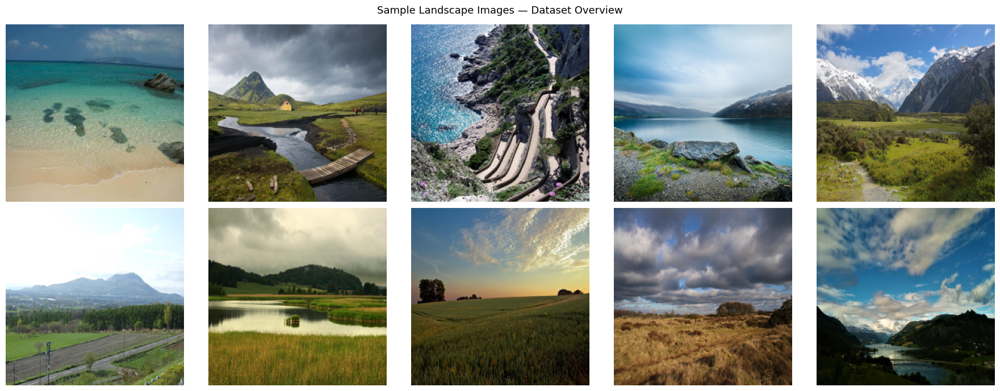

Dataset samples saved!


In [11]:
fig, axes = plt.subplots(2, 5, figsize=(18, 7))
sample_paths = random.sample(IMAGE_PATHS, 10)
for ax, path in zip(axes.flatten(), sample_paths):
    img = Image.open(path).convert('RGB').resize((256, 256))
    ax.imshow(np.array(img))
    ax.axis('off')
plt.suptitle('Sample Landscape Images — Dataset Overview', fontsize=13)
plt.tight_layout()
plt.savefig('dataset_samples.png', dpi=150, bbox_inches='tight')
plt.show()
print('Dataset samples saved!')

## Step 5: Hint Map Generator

A hint map is a sparse guide — same size as the image, mostly zeros.
A few pixels are filled with the target ab color values to tell the model
what color certain regions should be.

During training we auto-generate hints from ground truth.
At inference time users can provide their own hints.

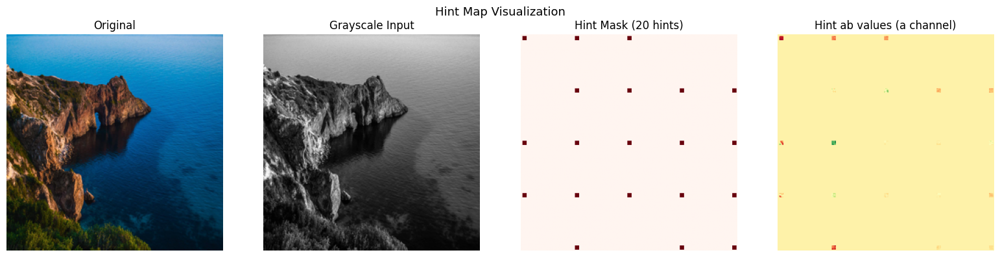

Hint map visualization saved!


In [12]:
def generate_hint_map(ab_gt, num_hints=20, hint_radius=2):
    """
    Generate a sparse hint map from ground truth ab channels.
    ab_gt: tensor [2, H, W] normalized to [-1, 1]
    Returns:
      hint_ab:   [2, H, W] — ab values at hint locations, 0 elsewhere
      hint_mask: [1, H, W] — 1 at hint locations, 0 elsewhere
    """
    _, H, W = ab_gt.shape
    hint_ab   = torch.zeros_like(ab_gt)
    hint_mask = torch.zeros(1, H, W)

    for _ in range(num_hints):
        # Pick a random location
        y = random.randint(hint_radius, H - hint_radius - 1)
        x = random.randint(hint_radius, W - hint_radius - 1)

        # Fill a small patch around that point
        y1, y2 = y - hint_radius, y + hint_radius + 1
        x1, x2 = x - hint_radius, x + hint_radius + 1

        hint_ab[:, y1:y2, x1:x2]   = ab_gt[:, y1:y2, x1:x2]
        hint_mask[:, y1:y2, x1:x2] = 1.0

    return hint_ab, hint_mask


def generate_semantic_hints(ab_gt, num_hints=15):
    """
    Smarter hint generation — picks hints from semantically different
    regions by sampling across a grid rather than purely random.
    """
    _, H, W = ab_gt.shape
    hint_ab   = torch.zeros_like(ab_gt)
    hint_mask = torch.zeros(1, H, W)

    grid_size = int(num_hints ** 0.5) + 1
    ys = np.linspace(4, H-4, grid_size, dtype=int)
    xs = np.linspace(4, W-4, grid_size, dtype=int)

    selected = [(y, x) for y in ys for x in xs]
    selected = random.sample(selected, min(num_hints, len(selected)))

    for y, x in selected:
        r = 2
        hint_ab[:, y-r:y+r+1, x-r:x+r+1]   = ab_gt[:, y-r:y+r+1, x-r:x+r+1]
        hint_mask[:, y-r:y+r+1, x-r:x+r+1] = 1.0

    return hint_ab, hint_mask


# Visualize what a hint map looks like
sample_img = Image.open(random.choice(IMAGE_PATHS)).convert('RGB').resize((256,256))
img_np     = np.array(sample_img).astype(np.float32) / 255.0
img_lab    = color.rgb2lab(img_np)
ab_gt      = torch.FloatTensor(img_lab[:,:,1:]).permute(2,0,1) / 128.0

hint_ab, hint_mask = generate_semantic_hints(ab_gt, num_hints=20)

# Visualize
fig, axes = plt.subplots(1, 4, figsize=(16, 4))
axes[0].imshow(np.array(sample_img));                     axes[0].set_title('Original')
gray = np.clip(img_lab[:,:,0] * 2.55, 0, 255).astype(np.uint8)
axes[1].imshow(gray, cmap='gray');                        axes[1].set_title('Grayscale Input')
axes[2].imshow(hint_mask[0].numpy(), cmap='Reds');        axes[2].set_title(f'Hint Mask (20 hints)')
hint_vis = (hint_ab[0].numpy() * 128 + 128).clip(0,255).astype(np.uint8)
axes[3].imshow(hint_vis, cmap='RdYlGn');                  axes[3].set_title('Hint ab values (a channel)')
for ax in axes: ax.axis('off')
plt.suptitle('Hint Map Visualization', fontsize=13)
plt.tight_layout()
plt.savefig('hint_map_visualization.png', dpi=150, bbox_inches='tight')
plt.show()
print('Hint map visualization saved!')

## Step 6: Conditional Colorization U-Net

Input: L (1ch) + hint_ab (2ch) + hint_mask (1ch) = 4 channels  
Output: ab channels (2ch)

In [13]:
class DoubleConv(nn.Module):
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1),
            nn.BatchNorm2d(out_ch), nn.ReLU(inplace=True),
            nn.Conv2d(out_ch, out_ch, 3, padding=1),
            nn.BatchNorm2d(out_ch), nn.ReLU(inplace=True),
        )
    def forward(self, x): return self.net(x)


class ConditionalColorizationUNet(nn.Module):
    """
    Hint-guided colorization U-Net.
    Input:  [B, 4, H, W]  — L + hint_ab (2ch) + hint_mask (1ch)
    Output: [B, 2, H, W]  — predicted ab channels
    """
    def __init__(self):
        super().__init__()
        self.pool = nn.MaxPool2d(2)

        # Encoder
        self.enc1 = DoubleConv(4, 64)
        self.enc2 = DoubleConv(64, 128)
        self.enc3 = DoubleConv(128, 256)
        self.enc4 = DoubleConv(256, 512)
        self.bottleneck = DoubleConv(512, 1024)

        # Decoder
        self.up4  = nn.ConvTranspose2d(1024, 512, 2, stride=2)
        self.dec4 = DoubleConv(1024, 512)
        self.up3  = nn.ConvTranspose2d(512, 256, 2, stride=2)
        self.dec3 = DoubleConv(512, 256)
        self.up2  = nn.ConvTranspose2d(256, 128, 2, stride=2)
        self.dec2 = DoubleConv(256, 128)
        self.up1  = nn.ConvTranspose2d(128, 64, 2, stride=2)
        self.dec1 = DoubleConv(128, 64)

        self.out_conv = nn.Conv2d(64, 2, 1)
        self.tanh     = nn.Tanh()

    def forward(self, x):
        e1 = self.enc1(x)
        e2 = self.enc2(self.pool(e1))
        e3 = self.enc3(self.pool(e2))
        e4 = self.enc4(self.pool(e3))
        b  = self.bottleneck(self.pool(e4))
        d4 = self.dec4(torch.cat([self.up4(b),  e4], dim=1))
        d3 = self.dec3(torch.cat([self.up3(d4), e3], dim=1))
        d2 = self.dec2(torch.cat([self.up2(d3), e2], dim=1))
        d1 = self.dec1(torch.cat([self.up1(d2), e1], dim=1))
        return self.tanh(self.out_conv(d1))


model = ConditionalColorizationUNet().to(device)
out   = model(torch.randn(2, 4, 256, 256).to(device))
print(f'Output shape: {out.shape}')  # [2, 2, 256, 256]
total = sum(p.numel() for p in model.parameters())
print(f'Total params: {total:,}')

Output shape: torch.Size([2, 2, 256, 256])
Total params: 31,044,162


## Step 7: Dataset

In [14]:
class LandscapeHintDataset(Dataset):
    """
    Landscape colorization with hint maps.
    Input:  L (1ch) + hint_ab (2ch) + hint_mask (1ch) = [4, H, W]
    Target: ab channels = [2, H, W]
    """
    def __init__(self, image_paths, size=256, num_hints=20):
        self.image_paths = image_paths
        self.size        = size
        self.num_hints   = num_hints
        print(f'Dataset: {len(image_paths)} images')

    def __len__(self): return len(self.image_paths)

    def __getitem__(self, idx):
        img = Image.open(self.image_paths[idx]).convert('RGB')
        img = img.resize((self.size, self.size), Image.BILINEAR)

        img_np  = np.array(img).astype(np.float32) / 255.0
        img_lab = color.rgb2lab(img_np)

        L  = torch.FloatTensor(img_lab[:,:,0]).unsqueeze(0) / 50.0 - 1.0  # [-1,1]
        ab = torch.FloatTensor(img_lab[:,:,1:]).permute(2,0,1) / 128.0    # [-1,1]

        # Generate hint map from ground truth ab
        hint_ab, hint_mask = generate_semantic_hints(ab, num_hints=self.num_hints)

        # Input: L + hint_ab + hint_mask = 4 channels
        model_input = torch.cat([L, hint_ab, hint_mask], dim=0)  # [4, H, W]
        return model_input, ab


random.shuffle(IMAGE_PATHS)
train_paths = IMAGE_PATHS[:int(0.8 * len(IMAGE_PATHS))]
val_paths   = IMAGE_PATHS[int(0.8 * len(IMAGE_PATHS)):]

train_set = LandscapeHintDataset(train_paths, size=256, num_hints=20)
val_set   = LandscapeHintDataset(val_paths,   size=256, num_hints=20)

train_loader = DataLoader(train_set, batch_size=8, shuffle=True,  num_workers=0, pin_memory=False)
val_loader   = DataLoader(val_set,   batch_size=8, shuffle=False, num_workers=0, pin_memory=False)

print(f'Train: {len(train_set)} | Val: {len(val_set)}')
print(f'Train batches: {len(train_loader)} | Val batches: {len(val_loader)}')

Dataset: 2400 images
Dataset: 600 images
Train: 2400 | Val: 600
Train batches: 300 | Val batches: 75


## Step 8: Training Setup

In [15]:
criterion  = nn.SmoothL1Loss()
optimizer  = optim.Adam(model.parameters(), lr=1e-3, weight_decay=1e-5)
scheduler  = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode='min', factor=0.5, patience=2
)

NUM_EPOCHS     = 5
CHECKPOINT_DIR = 'checkpoints'
os.makedirs(CHECKPOINT_DIR, exist_ok=True)

print('Training config:')
print(f'  Epochs:     {NUM_EPOCHS}')
print(f'  Optimizer:  Adam (lr=1e-3)')
print(f'  Loss:       SmoothL1 (Huber)')
print(f'  Scheduler:  ReduceLROnPlateau (patience=2)')
print(f'  Batch size: 8')
print(f'  Hint count: 20 per image')

Training config:
  Epochs:     5
  Optimizer:  Adam (lr=1e-3)
  Loss:       SmoothL1 (Huber)
  Scheduler:  ReduceLROnPlateau (patience=2)
  Batch size: 8
  Hint count: 20 per image


## Step 9: Training Loop (5 Epochs)

In [16]:
def run_epoch(model, loader, optimizer, criterion, is_train, epoch_num):
    model.train() if is_train else model.eval()
    total_loss = 0.0
    tag  = 'Train' if is_train else 'Val'
    pbar = tqdm(loader, desc=f'Epoch {epoch_num} [{tag}]', leave=False)
    ctx  = torch.enable_grad() if is_train else torch.no_grad()
    with ctx:
        for inputs, targets in pbar:
            inputs, targets = inputs.to(device), targets.to(device)
            if is_train: optimizer.zero_grad()
            outputs = model(inputs)
            loss    = criterion(outputs, targets)
            if is_train:
                loss.backward()
                torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
                optimizer.step()
            total_loss += loss.item()
            pbar.set_postfix(loss=f'{loss.item():.4f}')
    return total_loss / len(loader)


train_losses, val_losses = [], []
best_val_loss = float('inf')

print(f'Starting training — {NUM_EPOCHS} epochs')
print('=' * 60)

for epoch in range(1, NUM_EPOCHS + 1):
    t0 = time.time()
    t_loss = run_epoch(model, train_loader, optimizer, criterion, is_train=True,  epoch_num=epoch)
    v_loss = run_epoch(model, val_loader,   optimizer, criterion, is_train=False, epoch_num=epoch)
    scheduler.step(v_loss)
    train_losses.append(t_loss)
    val_losses.append(v_loss)
    lr      = optimizer.param_groups[0]['lr']
    elapsed = time.time() - t0
    print(f'Epoch [{epoch}/{NUM_EPOCHS}]  Train: {t_loss:.4f}  Val: {v_loss:.4f}  LR: {lr:.2e}  Time: {elapsed:.1f}s')

    if v_loss < best_val_loss:
        best_val_loss = v_loss
        torch.save({'epoch': epoch, 'model_state_dict': model.state_dict(),
                    'val_loss': v_loss}, f'{CHECKPOINT_DIR}/best_model.pth')
        print(f'         --> Best model saved (val={v_loss:.4f})')

print('=' * 60)
print(f'Training complete! Best val loss: {best_val_loss:.4f}')

Starting training — 5 epochs


Epoch [1/5]  Train: 0.0056  Val: 0.0049  LR: 1.00e-03  Time: 210.7s
         --> Best model saved (val=0.0049)


Epoch [2/5]  Train: 0.0039  Val: 0.0044  LR: 1.00e-03  Time: 211.2s
         --> Best model saved (val=0.0044)


Epoch [3/5]  Train: 0.0038  Val: 0.0034  LR: 1.00e-03  Time: 210.2s
         --> Best model saved (val=0.0034)


Epoch [4/5]  Train: 0.0037  Val: 0.0037  LR: 1.00e-03  Time: 210.1s


Epoch [5/5]  Train: 0.0035  Val: 0.0039  LR: 1.00e-03  Time: 208.6s
Training complete! Best val loss: 0.0034


## Step 10: Training Curves

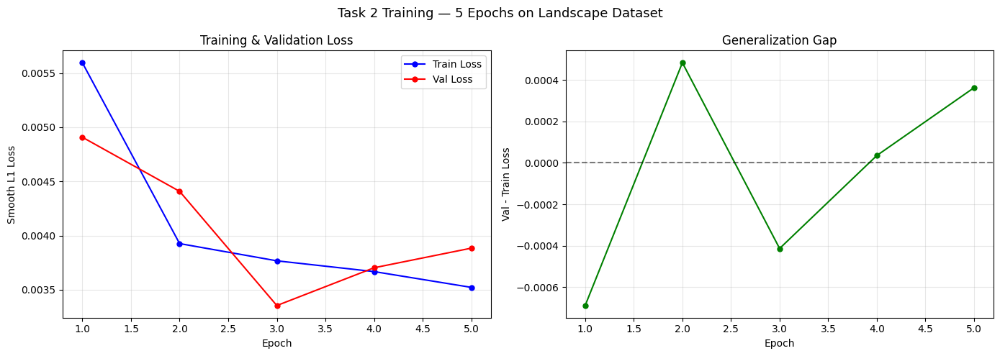

Train: 0.0056 → 0.0035
Val:   0.0049 → 0.0039


In [17]:
epochs = range(1, len(train_losses) + 1)
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].plot(epochs, train_losses, 'b-o', label='Train Loss', markersize=5)
axes[0].plot(epochs, val_losses,   'r-o', label='Val Loss',   markersize=5)
axes[0].set_xlabel('Epoch'); axes[0].set_ylabel('Smooth L1 Loss')
axes[0].set_title('Training & Validation Loss'); axes[0].legend(); axes[0].grid(True, alpha=0.3)

gap = [v - t for t, v in zip(train_losses, val_losses)]
axes[1].plot(epochs, gap, 'g-o', markersize=5)
axes[1].axhline(0, color='k', linestyle='--', alpha=0.5)
axes[1].set_xlabel('Epoch'); axes[1].set_ylabel('Val - Train Loss')
axes[1].set_title('Generalization Gap'); axes[1].grid(True, alpha=0.3)

plt.suptitle(f'Task 2 Training — {NUM_EPOCHS} Epochs on Landscape Dataset', fontsize=13)
plt.tight_layout()
plt.savefig('training_curves.png', dpi=150, bbox_inches='tight')
plt.show()
print(f'Train: {train_losses[0]:.4f} → {train_losses[-1]:.4f}')
print(f'Val:   {val_losses[0]:.4f} → {val_losses[-1]:.4f}')

## Step 11: Quality Metrics

In [18]:
def compute_colorfulness(img):
    img = img.astype(np.float32)
    R, G, B = img[:,:,0], img[:,:,1], img[:,:,2]
    rg, yb  = R - G, 0.5*(R+G) - B
    return np.sqrt(np.std(rg)**2 + np.std(yb)**2) + 0.3*np.sqrt(np.mean(rg)**2 + np.mean(yb)**2)

def compute_saturation(img):
    hsv = cv2.cvtColor(img.astype(np.uint8), cv2.COLOR_RGB2HSV)
    return hsv[:,:,1].mean()

def compute_ssim(img1, img2):
    g1 = cv2.cvtColor(img1.astype(np.uint8), cv2.COLOR_RGB2GRAY)
    g2 = cv2.cvtColor(img2.astype(np.uint8), cv2.COLOR_RGB2GRAY)
    score, _ = ssim(g1, g2, full=True)
    return score

def lab_to_rgb(L_norm, ab_norm):
    L  = (L_norm[0].cpu().numpy() + 1.0) * 50.0
    ab = ab_norm.cpu().numpy() * 128.0
    lab = np.stack([L, ab[0], ab[1]], axis=2)
    return np.clip(color.lab2rgb(lab) * 255, 0, 255).astype(np.uint8)

print('Metric functions defined!')

Metric functions defined!


## Step 12: Evaluate — With Hints vs Without Hints

In [19]:
# Load best model
ckpt = torch.load(f'{CHECKPOINT_DIR}/best_model.pth', map_location=device)
model.load_state_dict(ckpt['model_state_dict'])
model.eval()
print(f"Best model loaded from epoch {ckpt['epoch']} (val_loss={ckpt['val_loss']:.4f})")

cf_hint, cf_nohint   = [], []
sat_hint, sat_nohint = [], []
ssim_hint, ssim_nohint = [], []

eval_ids = random.sample(range(len(val_set)), min(100, len(val_set)))

with torch.no_grad():
    for idx in tqdm(eval_ids, desc='Evaluating'):
        inp, tgt_ab = val_set[idx]
        L_norm = inp[:1]

        # With hints (normal input)
        pred_hint = model(inp.unsqueeze(0).to(device)).squeeze(0).cpu()

        # Without hints (zero out hint channels)
        inp_nohint = inp.clone()
        inp_nohint[1:] = 0.0  # zero hint_ab and hint_mask
        pred_nohint = model(inp_nohint.unsqueeze(0).to(device)).squeeze(0).cpu()

        rgb_hint   = lab_to_rgb(L_norm, pred_hint)
        rgb_nohint = lab_to_rgb(L_norm, pred_nohint)
        rgb_gt     = lab_to_rgb(L_norm, tgt_ab)

        cf_hint.append(compute_colorfulness(rgb_hint))
        cf_nohint.append(compute_colorfulness(rgb_nohint))
        sat_hint.append(compute_saturation(rgb_hint))
        sat_nohint.append(compute_saturation(rgb_nohint))
        ssim_hint.append(compute_ssim(rgb_hint, rgb_gt))
        ssim_nohint.append(compute_ssim(rgb_nohint, rgb_gt))

print('\n=== Evaluation Results (100 val images) ===')
print(f'{"Metric":<20} {"With Hints":>15} {"Without Hints":>15}')
print('-' * 52)
print(f'{"Colorfulness":<20} {np.mean(cf_hint):>15.2f} {np.mean(cf_nohint):>15.2f}')
print(f'{"Saturation":<20} {np.mean(sat_hint):>15.2f} {np.mean(sat_nohint):>15.2f}')
print(f'{"SSIM":<20} {np.mean(ssim_hint):>15.4f} {np.mean(ssim_nohint):>15.4f}')

Best model loaded from epoch 3 (val_loss=0.0034)


Evaluating:   1%|          | 1/100 [00:00<00:12,  8.16it/s]/tmp/ipykernel_950/922852141.py:21: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 55 negative Z values that have been clipped to zero
  return np.clip(color.lab2rgb(lab) * 255, 0, 255).astype(np.uint8)
Evaluating:   3%|▎         | 3/100 [00:00<00:08, 11.07it/s]/tmp/ipykernel_950/922852141.py:21: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 21 negative Z values that have been clipped to zero
  return np.clip(color.lab2rgb(lab) * 255, 0, 255).astype(np.uint8)
Evaluating:   5%|▌         | 5/100 [00:00<00:08, 11.62it/s]/tmp/ipykernel_950/922852141.py:21: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 12 negative Z values that have been clipped to zero
  return np.clip(color.lab2rgb(lab) * 255, 0, 255).astype(np.uint8)
/tmp/ipykernel_950/922852141.py:21: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 16 nega


=== Evaluation Results (100 val images) ===
Metric                    With Hints   Without Hints
----------------------------------------------------
Colorfulness                   32.55           22.51
Saturation                     72.46           66.08
SSIM                          0.9934          0.9942


## Step 13: Metrics Comparison Chart

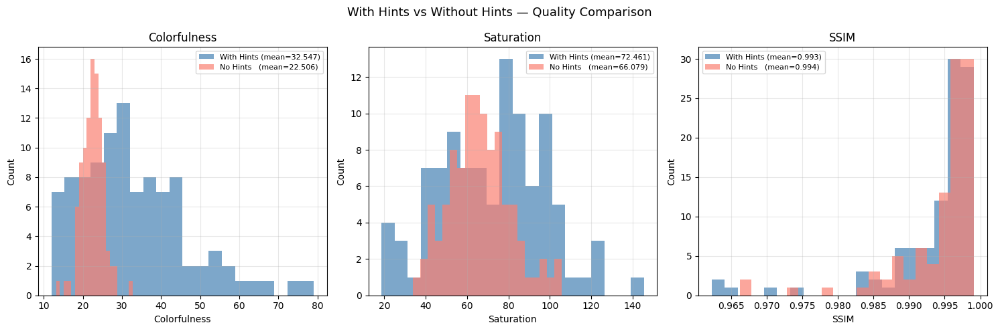

In [20]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
metrics = [
    ('Colorfulness', cf_hint,   cf_nohint),
    ('Saturation',   sat_hint,  sat_nohint),
    ('SSIM',         ssim_hint, ssim_nohint),
]

for ax, (name, with_h, without_h) in zip(axes, metrics):
    ax.hist(with_h,   bins=20, alpha=0.7, color='steelblue', label=f'With Hints (mean={np.mean(with_h):.3f})')
    ax.hist(without_h,bins=20, alpha=0.7, color='salmon',    label=f'No Hints   (mean={np.mean(without_h):.3f})')
    ax.set_title(name); ax.set_xlabel(name); ax.set_ylabel('Count')
    ax.legend(fontsize=8); ax.grid(True, alpha=0.3)

plt.suptitle('With Hints vs Without Hints — Quality Comparison', fontsize=13)
plt.tight_layout()
plt.savefig('metrics_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

## Step 14: Visualize Results — Hint Effect

/tmp/ipykernel_950/922852141.py:21: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 1 negative Z values that have been clipped to zero
  return np.clip(color.lab2rgb(lab) * 255, 0, 255).astype(np.uint8)
/tmp/ipykernel_950/922852141.py:21: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 111 negative Z values that have been clipped to zero
  return np.clip(color.lab2rgb(lab) * 255, 0, 255).astype(np.uint8)


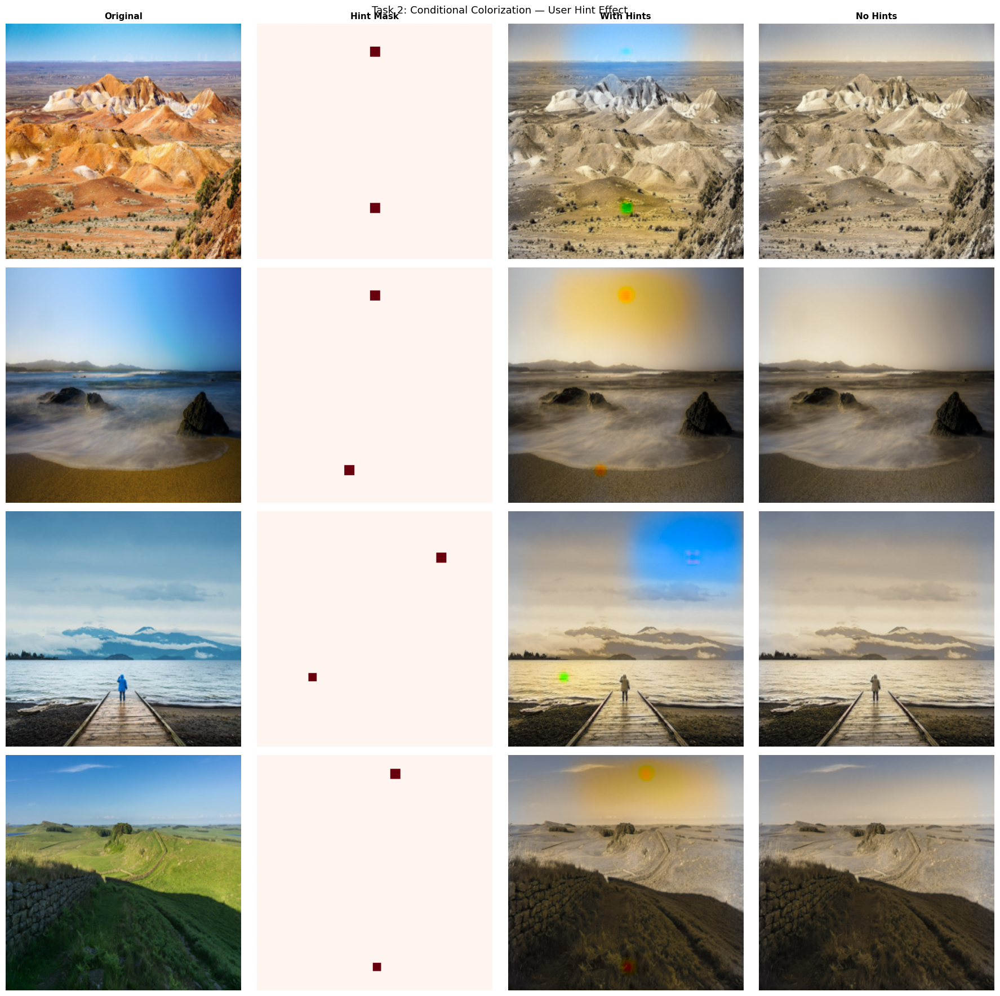

Hint effect visualization saved!


In [22]:
def colorize_with_custom_hints(img_path, hint_regions, model):
    """
    hint_regions: list of dicts with keys:
      y, x      — center pixel (0-255)
      color_rgb — (R, G, B) tuple
      radius    — patch size
    """
    img    = Image.open(img_path).convert('RGB').resize((256,256))
    img_np = np.array(img).astype(np.float32) / 255.0
    img_lab = color.rgb2lab(img_np)

    L  = torch.FloatTensor(img_lab[:,:,0]).unsqueeze(0) / 50.0 - 1.0
    ab = torch.FloatTensor(img_lab[:,:,1:]).permute(2,0,1) / 128.0

    hint_ab   = torch.zeros(2, 256, 256)
    hint_mask = torch.zeros(1, 256, 256)

    for h in hint_regions:
        y, x, r = h['y'], h['x'], h.get('radius', 3)
        # Convert RGB hint to LAB
        rgb_patch  = np.array(h['color_rgb'], dtype=np.float32).reshape(1,1,3) / 255.0
        lab_patch  = color.rgb2lab(rgb_patch)
        a_val = lab_patch[0,0,1] / 128.0
        b_val = lab_patch[0,0,2] / 128.0
        y1, y2 = max(0, y-r), min(256, y+r+1)
        x1, x2 = max(0, x-r), min(256, x+r+1)
        hint_ab[0, y1:y2, x1:x2]   = float(a_val)
        hint_ab[1, y1:y2, x1:x2]   = float(b_val)
        hint_mask[0, y1:y2, x1:x2] = 1.0

    inp = torch.cat([L, hint_ab, hint_mask], dim=0).unsqueeze(0).to(device)
    model.eval()
    with torch.no_grad():
        pred_ab = model(inp).squeeze(0).cpu()

    return lab_to_rgb(L, pred_ab), np.array(img), hint_mask[0].numpy()


# Demo: apply user-defined hints to landscape images
sample_paths = random.sample(val_paths, 4)

# Predefined hint sets simulating user input
hint_presets = [
    [{'y': 30,  'x': 128, 'color_rgb': (135,206,235), 'radius': 5},   # sky blue
     {'y': 200, 'x': 128, 'color_rgb': (34,139,34),   'radius': 5}],  # grass green
    [{'y': 30,  'x': 128, 'color_rgb': (255,165,0),   'radius': 5},   # sunset orange
     {'y': 220, 'x': 100, 'color_rgb': (101,67,33),   'radius': 5}],  # brown earth
    [{'y': 50,  'x': 200, 'color_rgb': (100,149,237),  'radius': 5},  # sky blue
     {'y': 180, 'x': 60,  'color_rgb': (0,100,0),     'radius': 4}],  # dark green
    [{'y': 20,  'x': 150, 'color_rgb': (255,200,100), 'radius': 5},   # warm yellow sky
     {'y': 230, 'x': 130, 'color_rgb': (139,90,43),   'radius': 4}],  # brown ground
]

fig, axes = plt.subplots(4, 4, figsize=(18, 18))
col_titles = ['Original', 'Hint Mask', 'With Hints', 'No Hints']
for c, t in enumerate(col_titles): axes[0,c].set_title(t, fontsize=11, fontweight='bold')

for row, (path, hints) in enumerate(zip(sample_paths, hint_presets)):
    colored_hint, orig_np, mask = colorize_with_custom_hints(path, hints, model)

    # No hints version
    img    = Image.open(path).convert('RGB').resize((256,256))
    img_np = np.array(img).astype(np.float32)/255.0
    img_lab = color.rgb2lab(img_np)
    L  = torch.FloatTensor(img_lab[:,:,0]).unsqueeze(0)/50.0 - 1.0
    inp_nohint = torch.cat([L, torch.zeros(3,256,256)], dim=0).unsqueeze(0).to(device)
    with torch.no_grad(): pred_nohint = model(inp_nohint).squeeze(0).cpu()
    colored_nohint = lab_to_rgb(L, pred_nohint)

    cf_h  = compute_colorfulness(colored_hint)
    cf_nh = compute_colorfulness(colored_nohint)

    axes[row,0].imshow(orig_np)
    axes[row,1].imshow(mask, cmap='Reds'); axes[row,1].set_xlabel(f'{len(hints)} hints', fontsize=8)
    axes[row,2].imshow(colored_hint);      axes[row,2].set_xlabel(f'CF={cf_h:.1f}', fontsize=8)
    axes[row,3].imshow(colored_nohint);    axes[row,3].set_xlabel(f'CF={cf_nh:.1f}', fontsize=8)
    for ax in axes[row]: ax.axis('off')

plt.suptitle('Task 2: Conditional Colorization — User Hint Effect', fontsize=13)
plt.tight_layout()
plt.savefig('hint_effect_visualization.png', dpi=150, bbox_inches='tight')
plt.show()
print('Hint effect visualization saved!')

## Step 15: Output Images (GUI Simulation)

/tmp/ipykernel_950/922852141.py:21: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 83 negative Z values that have been clipped to zero
  return np.clip(color.lab2rgb(lab) * 255, 0, 255).astype(np.uint8)


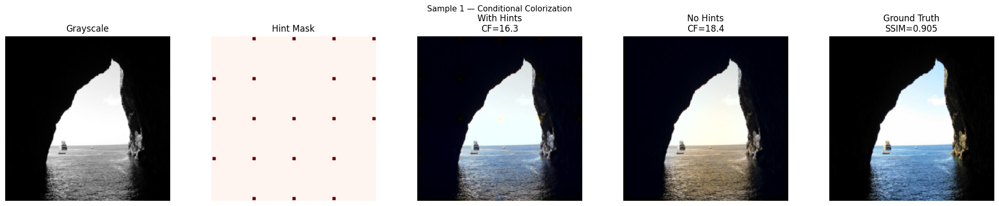

Sample 1 — CF(hint)=16.3  CF(no-hint)=18.4  SSIM=0.905


/tmp/ipykernel_950/922852141.py:21: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 8 negative Z values that have been clipped to zero
  return np.clip(color.lab2rgb(lab) * 255, 0, 255).astype(np.uint8)


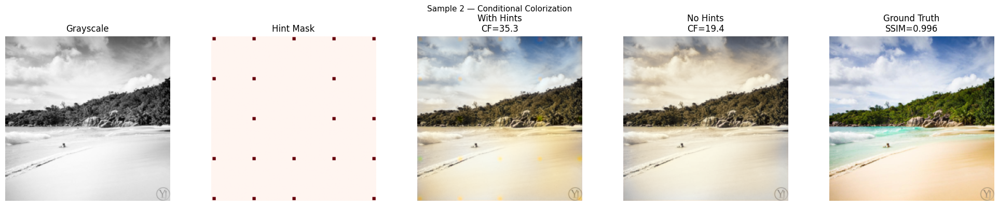

Sample 2 — CF(hint)=35.3  CF(no-hint)=19.4  SSIM=0.996


/tmp/ipykernel_950/922852141.py:21: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 15 negative Z values that have been clipped to zero
  return np.clip(color.lab2rgb(lab) * 255, 0, 255).astype(np.uint8)


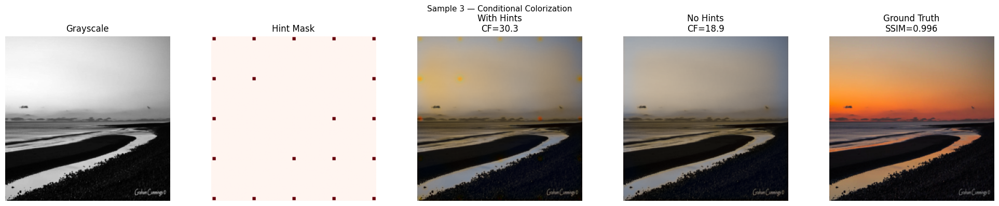

Sample 3 — CF(hint)=30.3  CF(no-hint)=18.9  SSIM=0.996


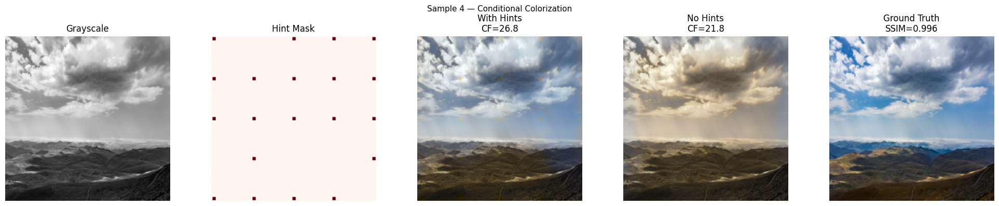

Sample 4 — CF(hint)=26.8  CF(no-hint)=21.8  SSIM=0.996


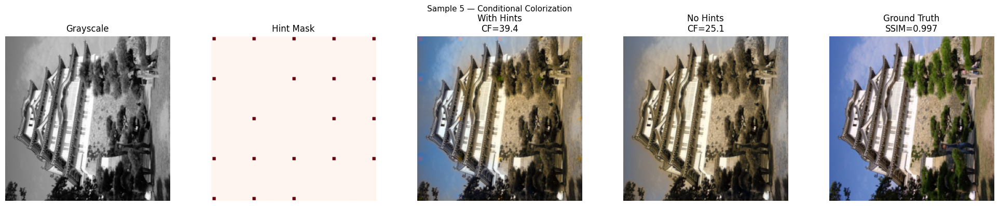

Sample 5 — CF(hint)=39.4  CF(no-hint)=25.1  SSIM=0.997


/tmp/ipykernel_950/922852141.py:21: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 4 negative Z values that have been clipped to zero
  return np.clip(color.lab2rgb(lab) * 255, 0, 255).astype(np.uint8)


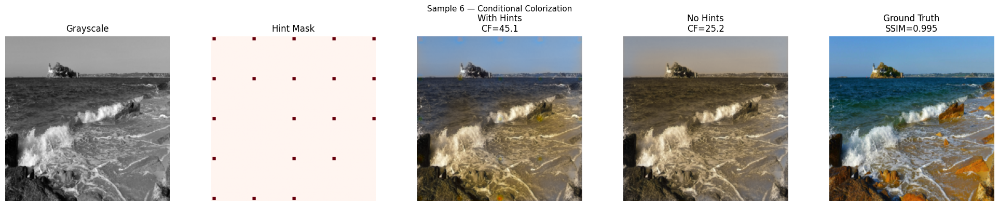

Sample 6 — CF(hint)=45.1  CF(no-hint)=25.2  SSIM=0.995


/tmp/ipykernel_950/922852141.py:21: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 14 negative Z values that have been clipped to zero
  return np.clip(color.lab2rgb(lab) * 255, 0, 255).astype(np.uint8)


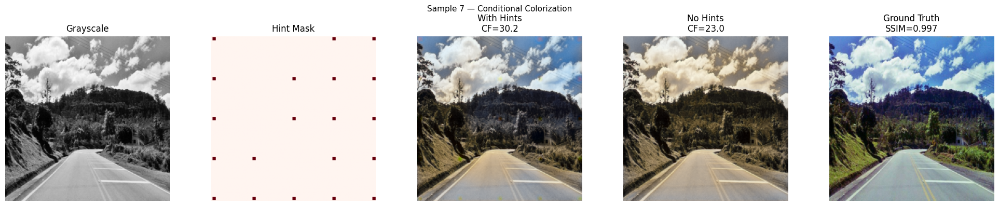

Sample 7 — CF(hint)=30.2  CF(no-hint)=23.0  SSIM=0.997


/tmp/ipykernel_950/922852141.py:21: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 19 negative Z values that have been clipped to zero
  return np.clip(color.lab2rgb(lab) * 255, 0, 255).astype(np.uint8)


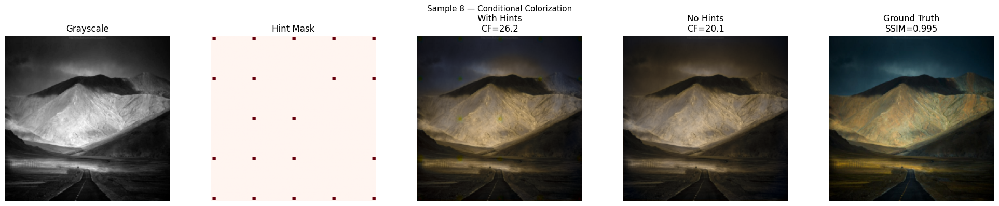

Sample 8 — CF(hint)=26.2  CF(no-hint)=20.1  SSIM=0.995


/tmp/ipykernel_950/922852141.py:21: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 10 negative Z values that have been clipped to zero
  return np.clip(color.lab2rgb(lab) * 255, 0, 255).astype(np.uint8)


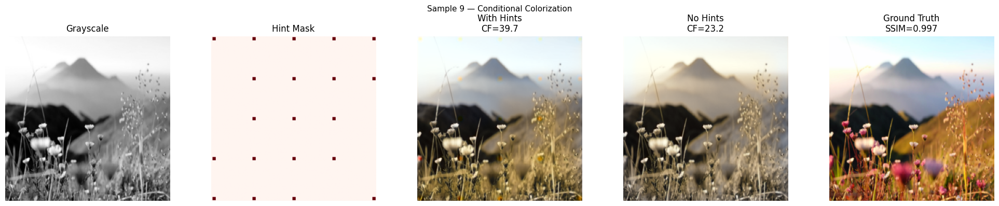

Sample 9 — CF(hint)=39.7  CF(no-hint)=23.2  SSIM=0.997


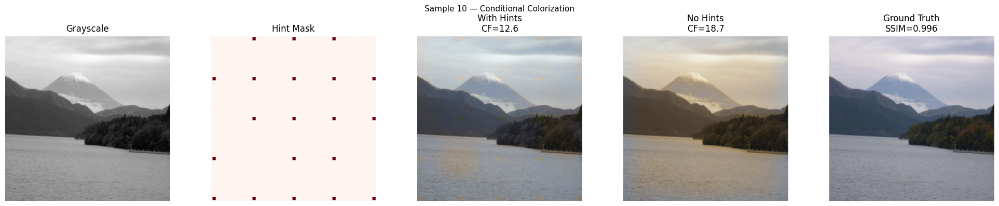

Sample 10 — CF(hint)=12.6  CF(no-hint)=18.7  SSIM=0.996

All 10 results saved and displayed!


In [25]:
os.makedirs('gui_outputs', exist_ok=True)
model.eval()

sample_ids = random.sample(range(len(val_set)), 10)

for i, idx in enumerate(sample_ids):
    inp, tgt_ab = val_set[idx]
    L_norm = inp[:1]

    with torch.no_grad():
        pred_hint = model(inp.unsqueeze(0).to(device)).squeeze(0).cpu()

    inp_nohint     = inp.clone()
    inp_nohint[1:] = 0.0
    with torch.no_grad():
        pred_nohint = model(inp_nohint.unsqueeze(0).to(device)).squeeze(0).cpu()

    gray       = np.clip((L_norm[0].numpy() + 1.0) * 127.5, 0, 255).astype(np.uint8)
    hint_vis   = inp[3].numpy()
    rgb_hint   = lab_to_rgb(L_norm, pred_hint)
    rgb_nohint = lab_to_rgb(L_norm, pred_nohint)
    rgb_gt     = lab_to_rgb(L_norm, tgt_ab)

    cf_h  = compute_colorfulness(rgb_hint)
    cf_nh = compute_colorfulness(rgb_nohint)
    ss    = compute_ssim(rgb_hint, rgb_gt)

    fig, axes = plt.subplots(1, 5, figsize=(20, 4))
    axes[0].imshow(gray, cmap='gray');     axes[0].set_title('Grayscale')
    axes[1].imshow(hint_vis, cmap='Reds'); axes[1].set_title('Hint Mask')
    axes[2].imshow(rgb_hint);              axes[2].set_title(f'With Hints\nCF={cf_h:.1f}')
    axes[3].imshow(rgb_nohint);            axes[3].set_title(f'No Hints\nCF={cf_nh:.1f}')
    axes[4].imshow(rgb_gt);               axes[4].set_title(f'Ground Truth\nSSIM={ss:.3f}')
    for ax in axes: ax.axis('off')
    plt.suptitle(f'Sample {i+1} — Conditional Colorization', fontsize=11)
    plt.tight_layout()
    plt.savefig(f'gui_outputs/result_{i+1}.png', dpi=150, bbox_inches='tight')
    plt.show()   # <-- this line shows it in the notebook output
    plt.close()
    print(f'Sample {i+1} — CF(hint)={cf_h:.1f}  CF(no-hint)={cf_nh:.1f}  SSIM={ss:.3f}')

print('\nAll 10 results saved and displayed!')

## Step 16: Save All Outputs

In [26]:
os.makedirs('task2_outputs', exist_ok=True)

for f in ['dataset_samples.png', 'hint_map_visualization.png', 'training_curves.png',
          'metrics_comparison.png', 'hint_effect_visualization.png']:
    if os.path.exists(f): shutil.copy(f, f'task2_outputs/{f}')

if os.path.exists(f'{CHECKPOINT_DIR}/best_model.pth'):
    shutil.copy(f'{CHECKPOINT_DIR}/best_model.pth', 'task2_outputs/best_model.pth')

summary = {
    'task':              'Task 2 - Conditional Image Colorization',
    'base_project':      'Real-Time Image Colorization (Training)',
    'new_features':      ['Sparse hint map input', 'User-defined color regions',
                          '4-channel input (L + hint_ab + hint_mask)', 'With/without hint comparison'],
    'dataset':           'Landscape Pictures (Kaggle) — 3000 images, 80/20 split',
    'epochs':            NUM_EPOCHS,
    'best_val_loss':     round(best_val_loss, 4),
    'final_train_loss':  round(train_losses[-1], 4),
    'final_val_loss':    round(val_losses[-1], 4),
    'mean_cf_with_hints':    round(float(np.mean(cf_hint)), 2),
    'mean_cf_without_hints': round(float(np.mean(cf_nohint)), 2),
    'mean_ssim_with_hints':  round(float(np.mean(ssim_hint)), 4),
}

with open('task2_outputs/metrics_summary.json', 'w') as f:
    json.dump(summary, f, indent=2)

print('All outputs saved to task2_outputs/')
print(json.dumps(summary, indent=2))

All outputs saved to task2_outputs/
{
  "task": "Task 2 - Conditional Image Colorization",
  "base_project": "Real-Time Image Colorization (Training)",
  "new_features": [
    "Sparse hint map input",
    "User-defined color regions",
    "4-channel input (L + hint_ab + hint_mask)",
    "With/without hint comparison"
  ],
  "dataset": "Landscape Pictures (Kaggle) \u2014 3000 images, 80/20 split",
  "epochs": 5,
  "best_val_loss": 0.0034,
  "final_train_loss": 0.0035,
  "final_val_loss": 0.0039,
  "mean_cf_with_hints": 32.55,
  "mean_cf_without_hints": 22.51,
  "mean_ssim_with_hints": 0.9934
}


## Summary Table

| Component | Detail |
|-----------|--------|
| Base project | Real-Time Image Colorization (training project) |
| New addition | Sparse hint map — user defines colors for specific regions |
| Model | ConditionalColorizationUNet (4-channel input: L + hint_ab + hint_mask) |
| Dataset | Landscape Pictures — 3000 images (2400 train / 600 val) |
| Epochs | 5 |
| Loss | Smooth L1 (Huber) |
| Optimizer | Adam + ReduceLROnPlateau |
| Key experiment | With hints vs without hints comparison on same images |
| Metrics | Colorfulness, Saturation, SSIM (with/without hint comparison) |